In [1]:
import pygmt
import numpy as np
import pandas as pd

In [2]:
grid = pygmt.datasets.load_earth_relief(resolution="01d")

In [3]:
minlon, maxlon = 60, 95
minlat, maxlat = 0, 25

In [4]:
#topo_data = '@earth_relief_30s' #30 arc second global relief (SRTM15+V2.1 @ 1.0 km)
#topo_data = '@earth_relief_15s' #15 arc second global relief (SRTM15+V2.1)
topo_data = '@earth_relief_03s' #3 arc second global relief (SRTM3S)

In [5]:
# Visualization
fig = pygmt.Figure()

In [6]:
# make color pallets
pygmt.makecpt(
    cmap='topo',
    series='-8000/8000/1000',
    continuous=True
)

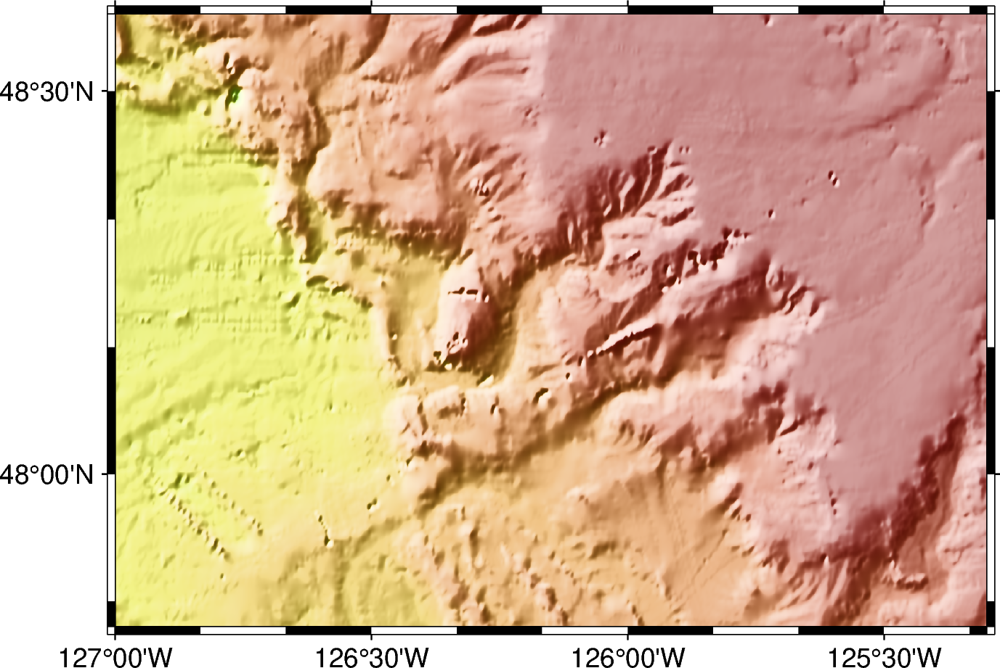

In [7]:
#plot high res topography
fig.grdimage(
    grid=topo_data,
    region=[-127,-125.3,47.8,48.6],
    projection='M4i',
    shading=True,
    frame=True
    )
fig.show()

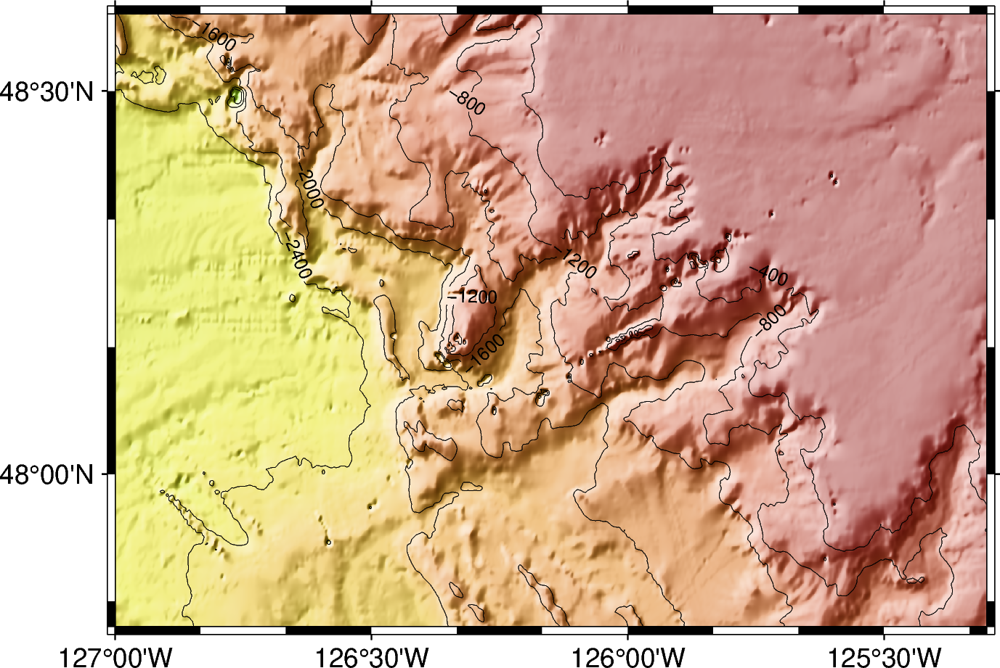

In [8]:
fig.grdcontour(
    grid=topo_data,
    interval=400,
    annotation="400+f6p",
    limit="-8000/0",
    pen="a0.15p"
    )
fig.show()

In [9]:
lons = -126.05053081,-125.87558298,-126.06586077,-126.058533,-126.17411321
lats = 48.31667065,48.3332,48.31208028,48.314901,48.42754912
#depth = 983,402,871,893,600

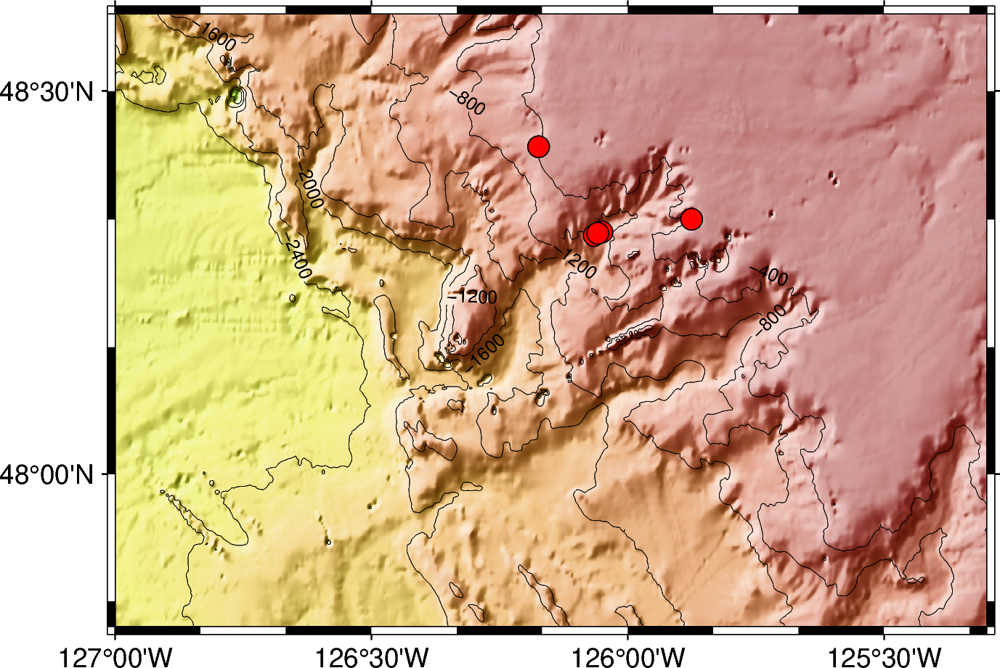

In [10]:
# plot data points
fig.plot(
    x=lons,
    y=lats,
    style='c0.1i',
    color='red',
    pen='black',
    label='something',
    )
fig.show()

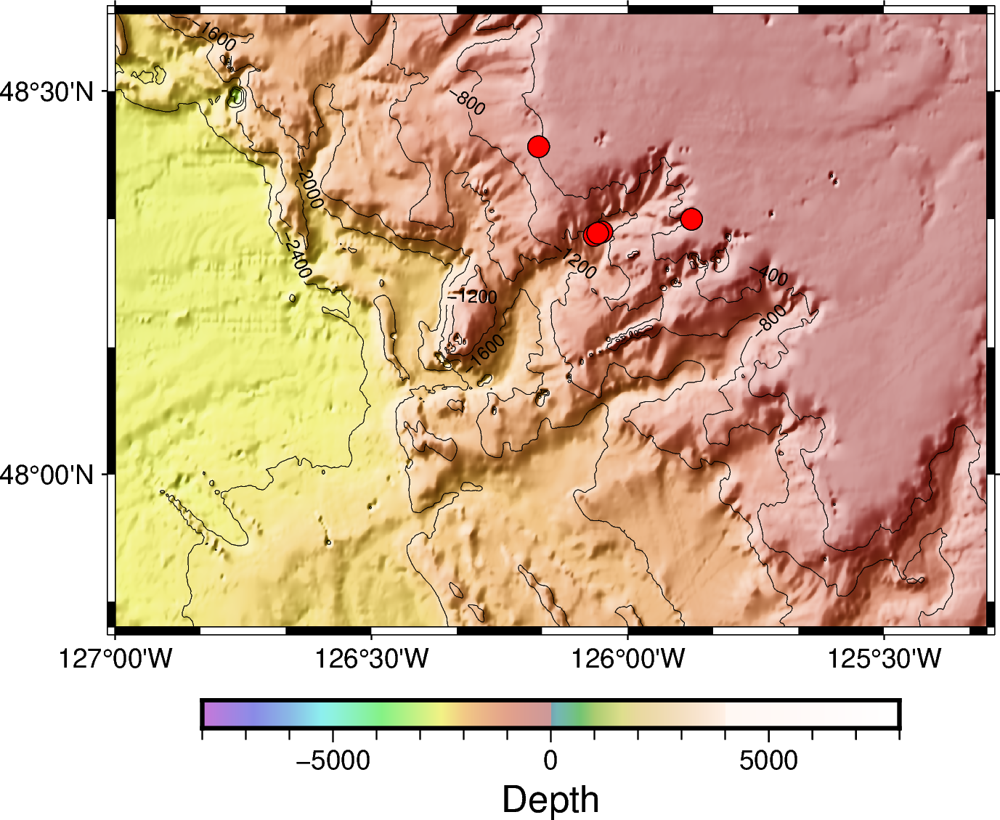

In [11]:
# Plot colorbar
fig.colorbar(
    frame='+l"Depth"'
    )
fig.show()

In [12]:
data = pd.read_csv('/Users/mjcu11/Downloads/IEB_export (1).csv')

# Set the region for the plot to be slightly larger than the data bounds.
region = [
    data.longitude.min() - 3,
    data.longitude.max() + 4,
    data.latitude.min() - 2,
    data.latitude.max() + 2,
]

print(region)
print(data.head())

[-133.2782, -124.83930000000001, 47.0689, 52.9158]
     Year  Month   Day      Time  latitude  longitude  depth_km  magnitude  \
0  2018.0   10.0  22.0   6:16:26   49.3346  -129.2890      10.0        6.8   
1  2018.0   10.0  22.0   5:39:39   49.2586  -129.4124      10.0        6.5   
2  2018.0   10.0  22.0   6:22:48   49.2970  -129.7237      10.0        6.5   
3  2019.0   12.0  25.0   3:36:01   50.6106  -129.9630       6.6        6.3   
4  2019.0   12.0  23.0  19:49:43   50.6071  -129.9372      10.0        6.0   

                           Region     Timestamp  
0  202km SW of Port Hardy, Canada  1.540189e+09  
1  214km SW of Port Hardy, Canada  1.540187e+09  
2  227km SW of Port Hardy, Canada  1.540189e+09  
3   180km W of Port Hardy, Canada  1.577245e+09  
4   178km W of Port Hardy, Canada  1.577131e+09  


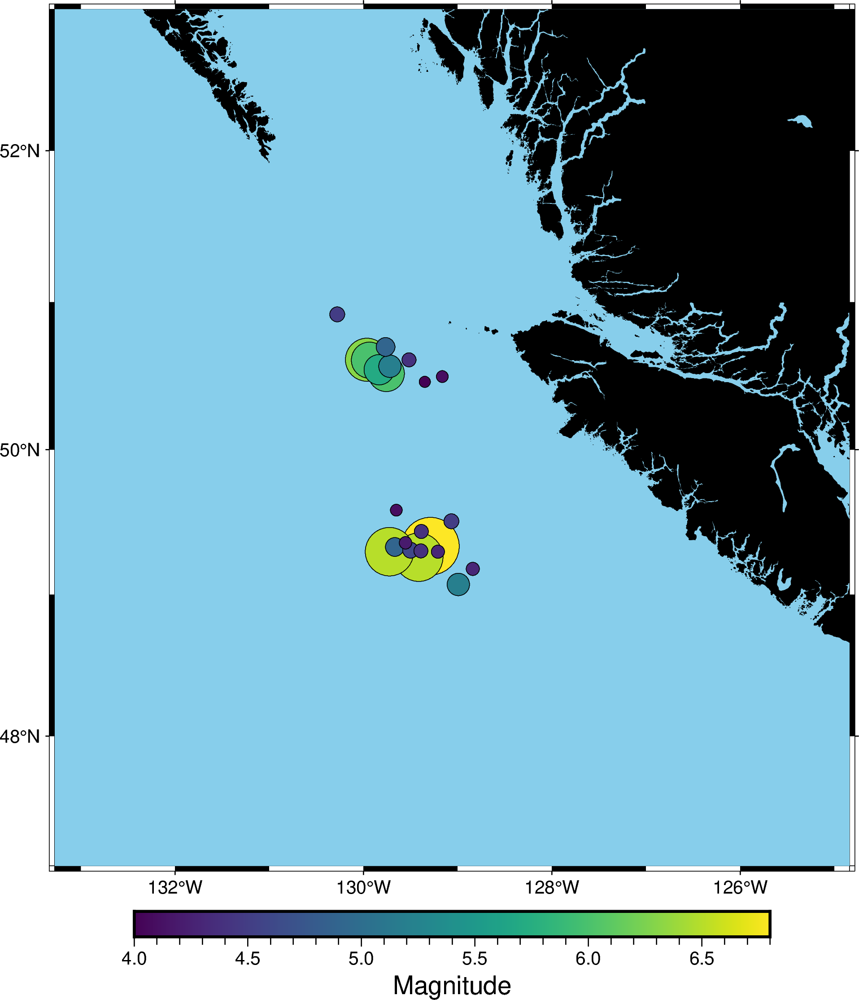

In [13]:
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="black", water="skyblue")
pygmt.makecpt(cmap="viridis", series=[data.magnitude.min(), data.magnitude.max()])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    size=0.02 * 1.8 ** data.magnitude,
    color=data.magnitude,
    cmap=True,
    style="cc",
    pen="black",
)
fig.colorbar(frame='af+l"Magnitude"')
fig.show()

In [14]:
import pygmt

# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="01m", region=[-127,-125.3,47.9,48.3])
                                                                        

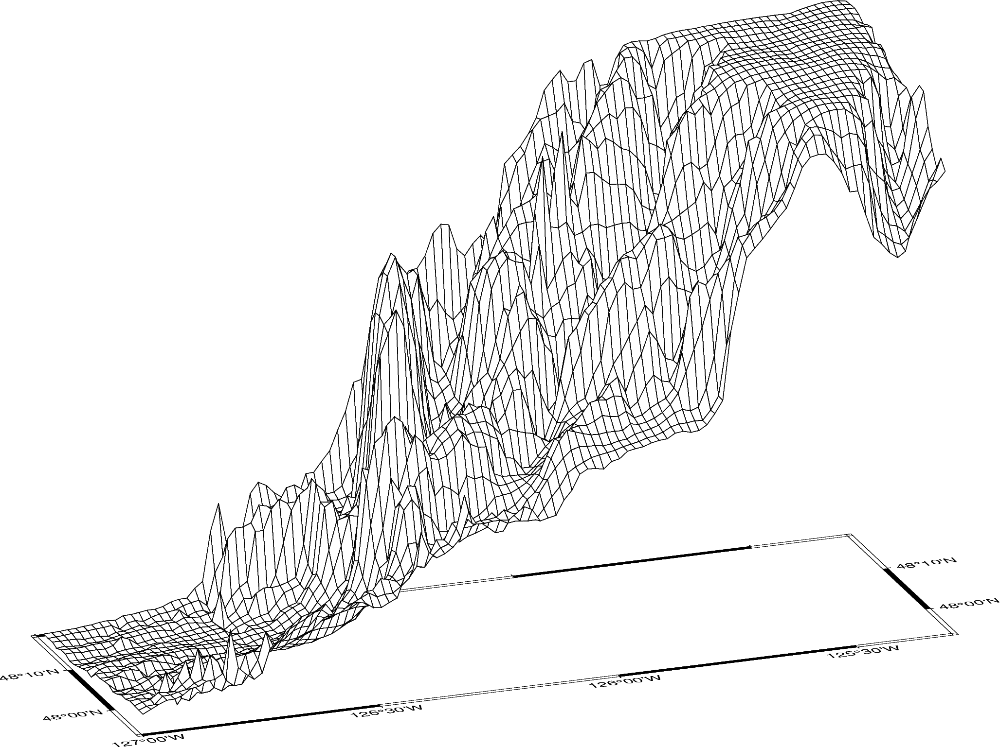

In [20]:
fig = pygmt.Figure()
fig.grdview(
    grid=grid,
    # Sets the view azimuth as 130 degrees, and the view elevation as 30
    # degrees
    perspective=[200, 20],
    # Sets the x- and y-axis labels, and annotates the west, south, and east
    # axes
    frame=["xa", "ya", "WSnE"],
    # Sets a Mercator projection on a 15-centimeter figure
    projection="M15c",
    # Sets the height of the three-dimensional relief at 1.5 centimeters
    zsize="10c",
)
fig.show()

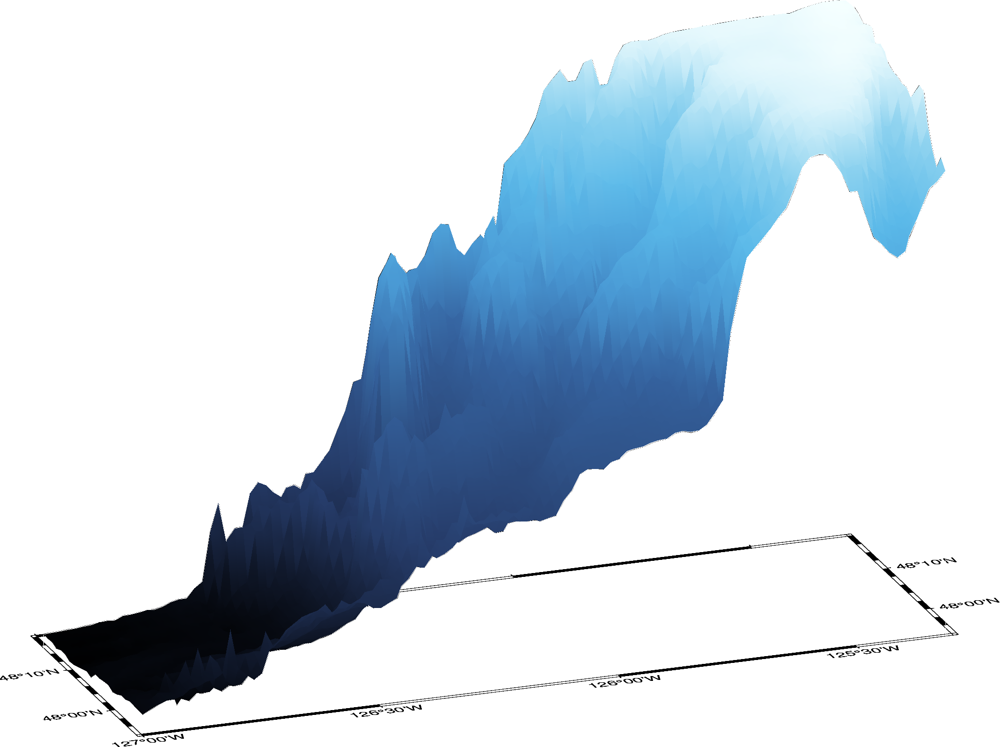

In [21]:
fig.grdview(
    grid=grid,
    perspective=[200, 20],
    frame=["xa", "yaf", "WSnE"],
    projection="M15c",
    zsize="10c",
    # Set the surftype to "surface"
    surftype="i",
    # Set the CPT to "geo"
    cmap="geo",
    plane="-6000+gazure",
)
fig.show()

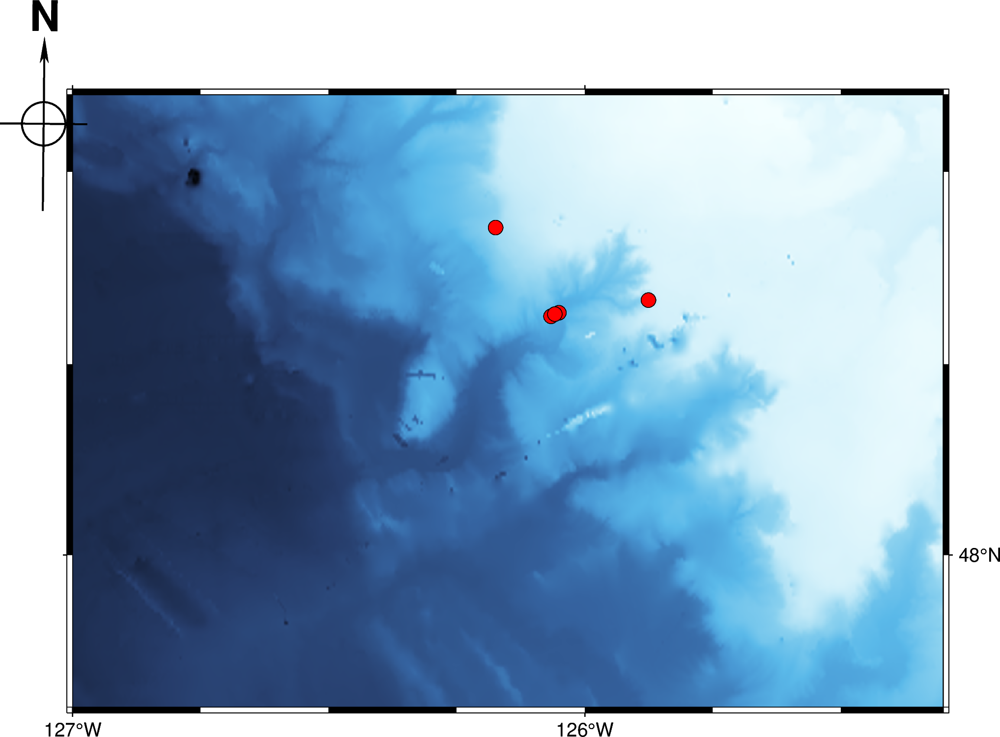

In [601]:
minlon, maxlon = -127, -125.3
minlat, maxlat = 47.8, 48.6

# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=[minlon, maxlon, minlat, maxlat])

#frame =  ["xa1f0.25","ya1f0.25", "z2000+lmeters", "wSEnZ"]

pygmt.makecpt(
        cmap='geo',
        series=f'-6000/4000/100',
        continuous=True
    )
fig = pygmt.Figure()
fig.grdview(
    grid=grid,
    region=[minlon, maxlon, minlat, maxlat],
    perspective=[180, 90],
    frame=frame,
    projection="M15c",
    zsize="8c",
    surftype="i",
    
    shading=0,
    # Set the contour pen thickness to "1p"
    contourpen="1p",
    cmap="geo"
)
fig.plot(
    x=lons,
    y=lats,
    style='c0.1i',
    color='red',
    pen='black',
    label='something',
    perspective=True
    )

fig.basemap(
    perspective=True,
    rose="jTL+w3c+l+o-2c/-1c" #map directional rose at the top left corner 
)
fig.show()

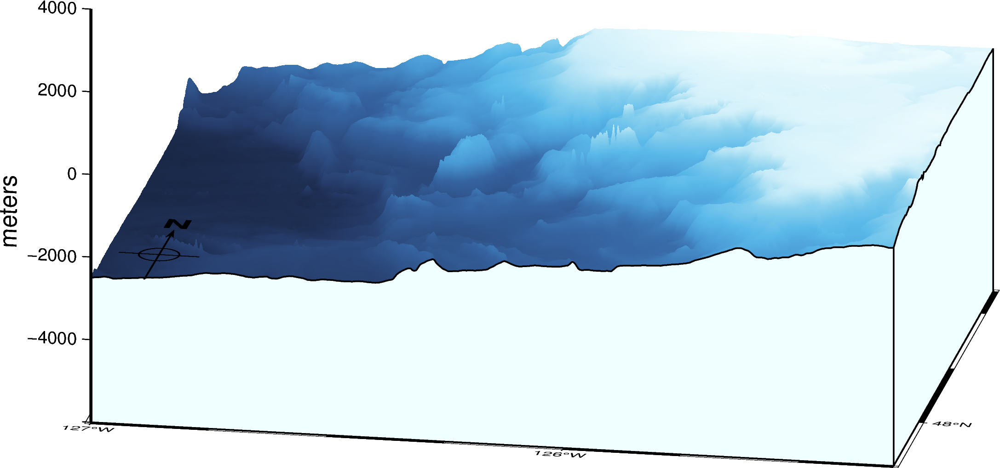

In [558]:
minlon, maxlon = -127, -125.3
minlat, maxlat = 47.8, 48.6

# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=[minlon, maxlon, minlat, maxlat])

frame =  ["xa1f0.25","ya1f0.25", "z2000+lmeters", "wSEnZ"]

pygmt.makecpt(
        cmap='geo',
        series=f'-6000/4000/100',
        continuous=True
    )
fig = pygmt.Figure()
fig.grdview(
    grid=grid,
    region=[minlon, maxlon, minlat, maxlat, -6000, 4000],
    perspective=[170, 18],
    frame=frame,
    projection="M15c",
    zsize="8c",
    surftype="i",
    plane="-6000+gazure",
    shading=0,
    # Set the contour pen thickness to "1p"
    contourpen="1p",
    cmap="geo"
)


fig.basemap(
    perspective=True,
    rose="jTL+w3c+l+o-2c/-1c" #map directional rose at the top left corner 
)
fig.show()

In [25]:
data = pd.read_csv('/Users/mjcu11/Downloads/IEB_export (1).csv')


minlon, maxlon = -130, -122
minlat, maxlat = 44, 51
# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=[minlon, maxlon, minlat, maxlat])

frame =  ["xa1f0.25","ya1f0.25", "z2000+lmeters", "wSEnZ"]

pygmt.makecpt(
        cmap='geo',
        series=f'-{maxdep}/4000/100',
        continuous=True
    )
fig = pygmt.Figure()
fig.grdview(
    grid=grid,
    region=[minlon, maxlon, minlat, maxlat, -maxdep, 4000],
    perspective=[150, 30],
    frame=frame,
    projection="M15c",
    zsize="4c",
    surftype="i",
    plane=f"-{maxdep}+gazure",
    shading=0,
    # Set the contour pen thickness to "1p"
    contourpen="1p",
    
)


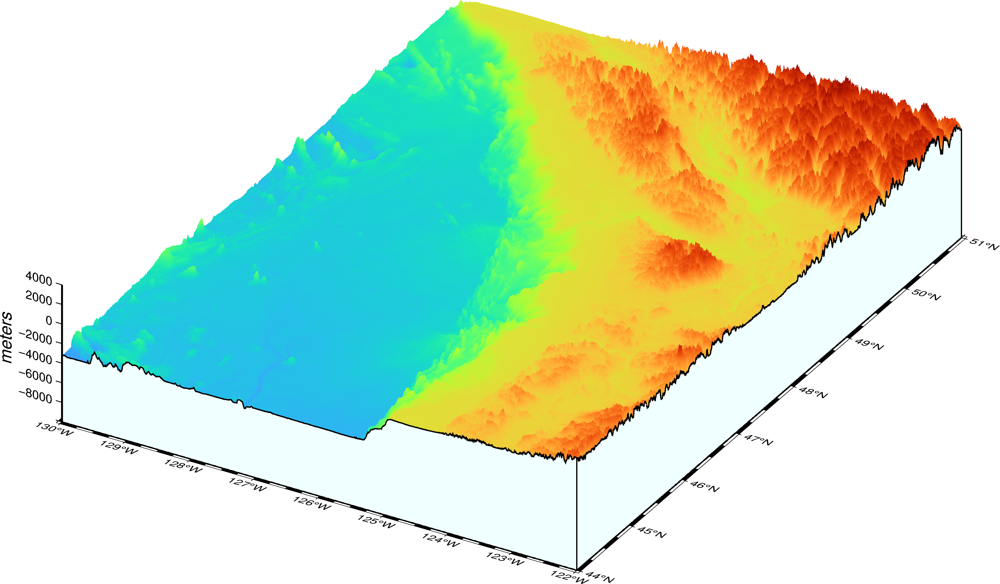

In [26]:
fig.show()

In [283]:
# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="01m", region=[-127,-125.3,47.8,48.6])

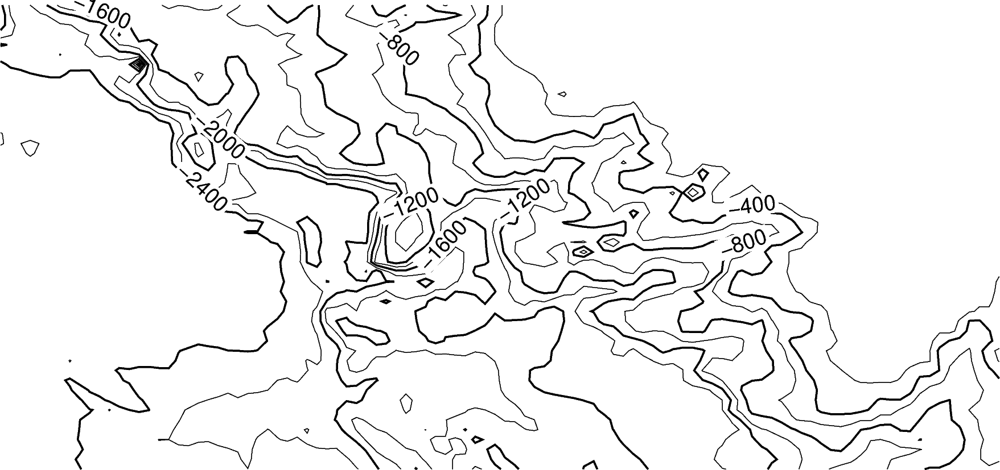

In [284]:
fig = pygmt.Figure()
fig.grdcontour(grid=grid)
fig.show()

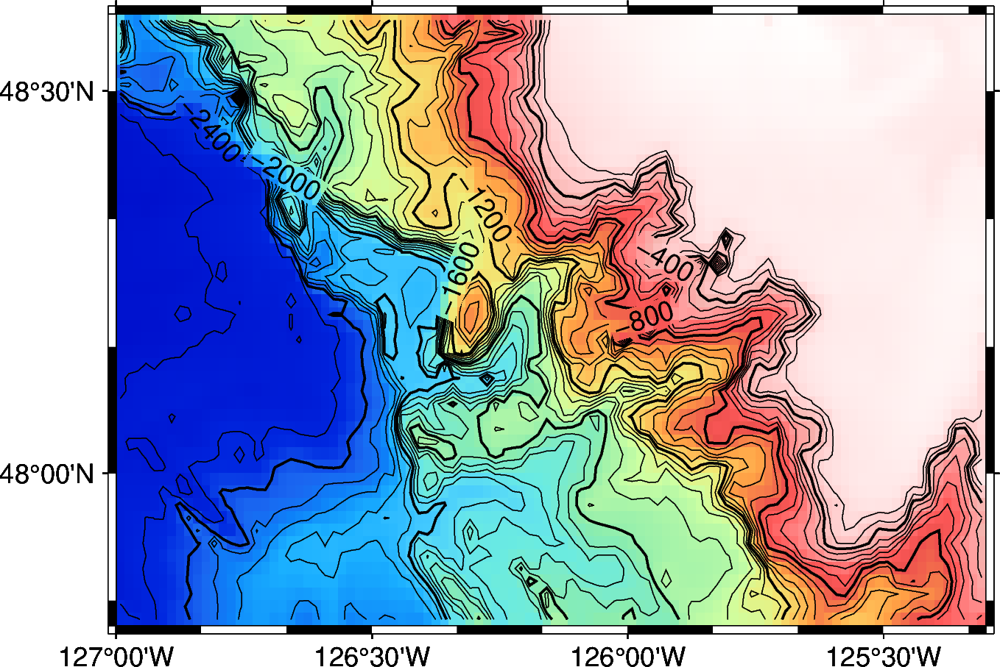

In [288]:
fig = pygmt.Figure()
fig.grdimage(
    grid=grid,
    cmap="haxby",
    projection="M10c",
    frame=True,
)

fig.grdcontour(
    annotation=400,
    interval=80,
    grid=grid,
    limit=[-5000, -200],
    projection="M10c",
    frame=True,
)
fig.show()